## Day 16-17 Historical maps of Vormsi Island

### Data

Estonian Land Board Maa-Amet

- https://geoportaal.maaamet.ee/eng/Services/Public-WMS-Service-p346.html

In [1]:
import owslib

In [2]:
from owslib.wms import WebMapService
wms = WebMapService('https://kaart.maaamet.ee/wms/ajalooline', version='1.3.0')

In [3]:
wms.identification.title

'Maa-ameti ajaloolised kaardid'

In [4]:
list(wms.contents)

['MA-AJAL',
 'Halduspiir_raster',
 'yheverstakaart_alt',
 'kaheverstakaart_alt',
 'kolmeverstakaart_alt',
 'nltopo_1M_alt',
 'nltopo_500T_alt',
 'nltopo_300T_alt',
 'nltopo_vanem_200T_alt',
 'nltopo_vanem_100T_alt',
 'nltopo_vanem_50T_alt',
 'nltopo_vanem_25T_alt',
 'nltopo_keskmine_200T_alt',
 'nltopo_keskmine_100T_alt',
 'nltopo_keskmine_50T_alt',
 'nltopo_keskmine_25T_alt',
 'nltopo_uuem_200T_alt',
 'nltopo_uuem_100T_alt',
 'nltopo_uuem_50T_alt',
 'nltopo_uuem_25T_alt',
 'nltopo_c63_25T_vanem_alt',
 'nltopo_c63_25T_uuem_alt',
 'nltopo_o42_10T_alt',
 'nltopo_c63_10T_alt',
 'yheverstakaart',
 'yheverstakaart_info',
 'kaheverstakaart',
 'kaheverstakaart_info',
 'kolmeverstakaart',
 'kolmeverstakaart_info',
 'ew_200T',
 'ew_200T_info',
 'ew_50T',
 'ew_50T_info',
 'ew_25T',
 'ew_25T_info',
 'heereskarte',
 'heereskarte_info',
 'vanaBaaskaart',
 'vanaBaaskaart_info',
 'ekj_50T',
 'ekj_50T_info',
 'nltopo_1M',
 'nltopo_1M_info',
 'nltopo_500T',
 'nltopo_500T_info',
 'nltopo_300T',
 'nltopo

In [59]:
selection = [
    
    'Halduspiir_raster',
    'yheverstakaart_alt',
    'kaheverstakaart_alt',
    'kolmeverstakaart_alt',
    'kolmeverstakaart',

    'nltopo_300T_alt',
    'nltopo_vanem_50T_alt',
    'nltopo_vanem_25T_alt',
    'nltopo_c63_25T_vanem_alt',
    'nltopo_c63_25T_uuem_alt',
    'vanaBaaskaart',
    'nl_merekaart',
    'heereskarte',
    
    'pk_vr2009',
    'pk_vr2010',
    'pk_vr2011',
    'pk_vr2012',
    'pk_vr2013',
    'pk_vr2014',
    'pk_vr2015',
    'pk_vr2016',
    'pk_vr2017',
    'pk_vr2018',
    'pk_vr2019',
    'pk_vr2020',
    'of2008aero',
    'of2012aero',
    'of2016aero',
    'of2020aero',
    'MA-AJAL',
]

In [60]:
print([op.name for op in wms.operations])


print(wms.getOperationByName('GetMap').methods)


print(wms.getOperationByName('GetMap').formatOptions)

['GetCapabilities', 'GetMap', 'GetFeatureInfo', 'DescribeLayer', 'GetLegendGraphic', 'GetStyles']
[{'type': 'Get', 'url': 'https://kaart.maaamet.ee/wms/ajalooline?'}, {'type': 'Post', 'url': 'https://kaart.maaamet.ee/wms/ajalooline?'}]
['image/png', 'image/jpeg']


In [61]:
import geopandas as gpd

aoi_3301 = gpd.read_file('../data_archive/vormsi_island.gpkg', driver='GPKG', layer='vormsi_island')
aoi_wgs84 = gpd.read_file('../data_archive/vormsi_island.gpkg', driver='GPKG', layer='vormsi_wgs84')

In [62]:
for layer_id in selection:
    
    print("-----------")
    print(layer_id)
    print(wms[layer_id].title)
    # print(wms[layer_id].queryable)
    # print(wms[layer_id].opaque)
    # print(wms[layer_id].boundingBox)
    print(wms[layer_id].boundingBoxWGS84)
    print(wms[layer_id].crsOptions)
    # print(wms[layer_id].styles)


-----------
Halduspiir_raster
Schmidt Eestimaa / Rücker Liivimaa aluskaardid (XIX saj. / 1884)
(20.373, 56.7458, 29.4338, 60.4349)
['EPSG:3301']
-----------
yheverstakaart_alt
Üheverstane kaart (1894-1922)
(21.3149, 57.2238, 28.4709, 59.9863)
['EPSG:3301']
-----------
kaheverstakaart_alt
Kaheverstane kaart (1895-1918)
(21.3149, 57.2238, 28.4709, 59.9863)
['EPSG:3301']
-----------
kolmeverstakaart_alt
Kolmeverstane kaart (1866-1915)
(20.373, 56.6693, 31.2328, 60.4349)
['EPSG:3301']
-----------
kolmeverstakaart
Kolmeverstane kaart (1866-1915)
(20.373, 56.6693, 31.2328, 60.4349)
['EPSG:3301']
-----------
nltopo_300T_alt
NL o42 topo 1:300 000
(21.0197, 57.1988, 30.2354, 60.1345)
['EPSG:3301']
-----------
nltopo_vanem_50T_alt
NL o42 topo 1:50 000
(21.3149, 57.2238, 28.4709, 59.9863)
['EPSG:3301']
-----------
nltopo_vanem_25T_alt
NL o42 topo 1:25 000
(21.507, 57.403, 28.4472, 59.8068)
['EPSG:3301']
-----------
nltopo_c63_25T_vanem_alt
NL c63 topo 1:25 000
(21.507, 57.403, 28.4472, 59.8068)
[

In [63]:
bb = aoi_3301.bounds.iloc[0]

bb['minx'] 

449279.810671944

In [64]:
ratio = ( bb['maxx'] - bb['minx'] ) / ( bb['maxy'] - bb['miny'] )

width=400
height=int( 400 / ratio )

print(f"ratio {ratio} / width {width} / height {height}")

ratio 1.4323722009328919 / width 400 / height 279


In [65]:
img = wms.getmap(layers=['HYBRID'],
                 srs='EPSG:3301',
                 bbox=(bb['minx'], bb['miny'], bb['maxx'], bb['maxy']),
                 size=(width, height),
                 format='image/png'
                )

out = open('wms_tile.png', 'wb')
out.write(img.read())
out.close()

In [29]:
type(img.read())

bytes

In [30]:
dir(img)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_response',
 'geturl',
 'info',
 'read']

NameError: name 'row' is not defined

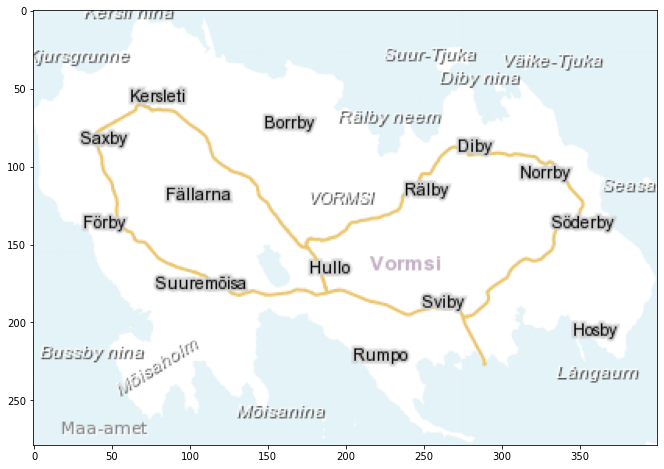

In [71]:
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.image as mpimg

plt.figure(figsize=(12,8))

load_img = mpimg.imread('wms_tile.png')
imgplot = plt.imshow(load_img)


plt.text(row['cent_x'], row['cent_y'],"{}\n".format(row['ISO_A3'],),size=8, color='black')
plt.title('layername')
plt.axis("off")
plt.show()


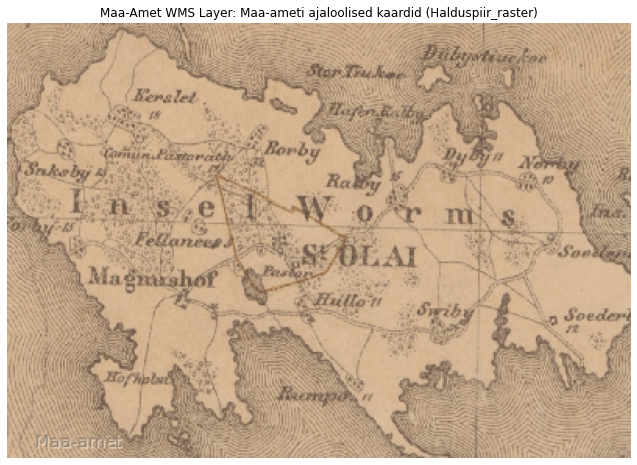

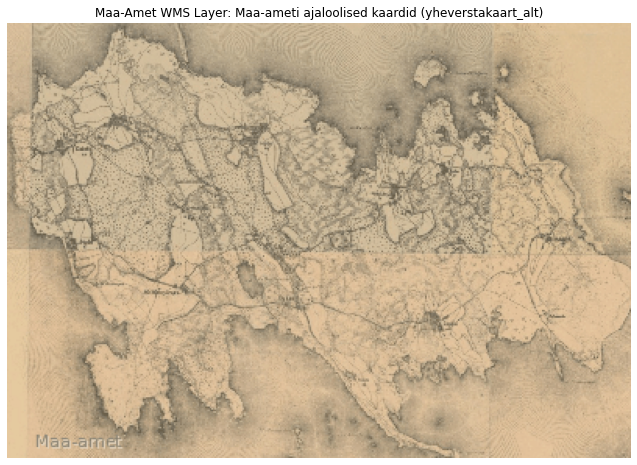

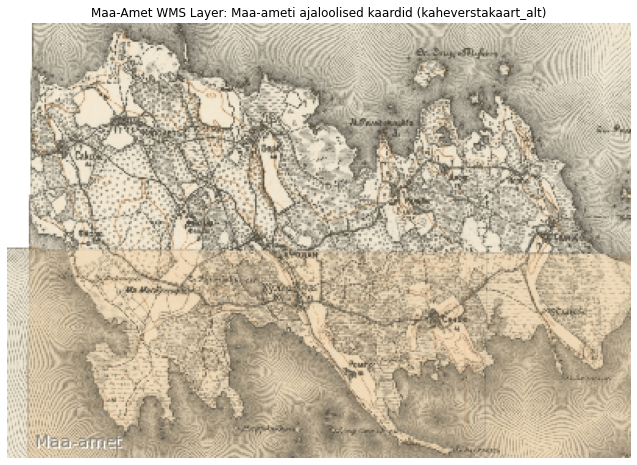

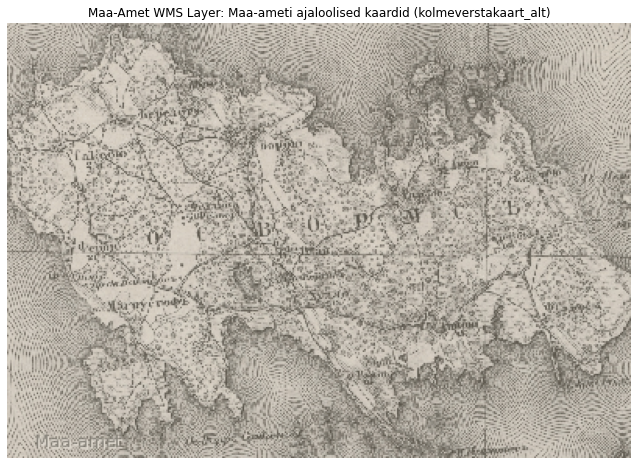

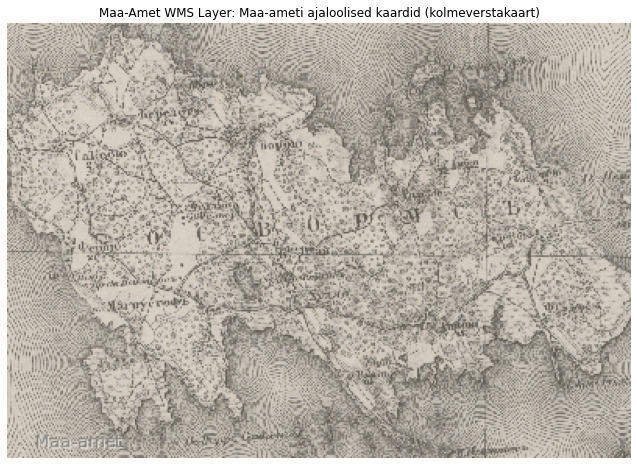

...

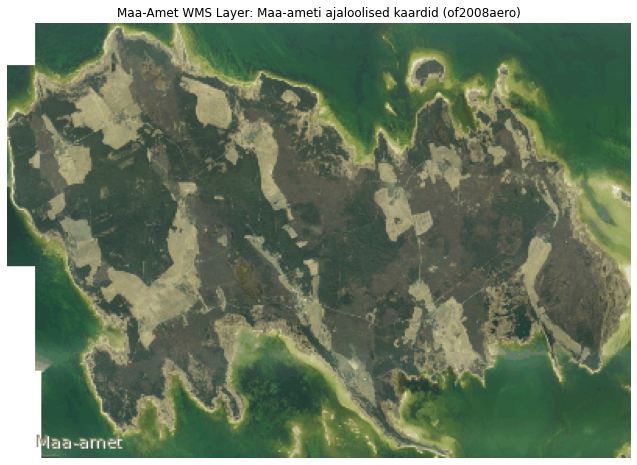

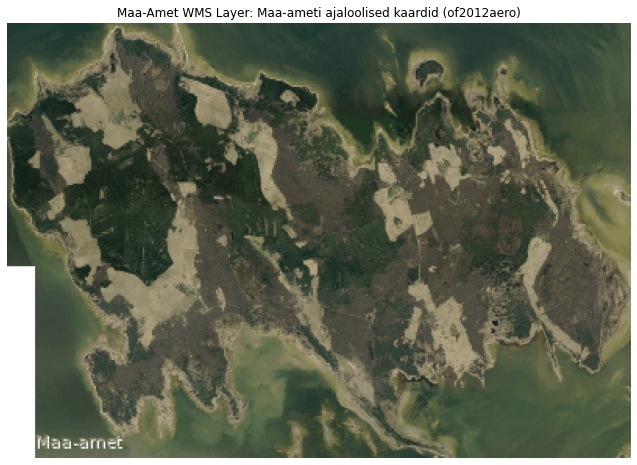

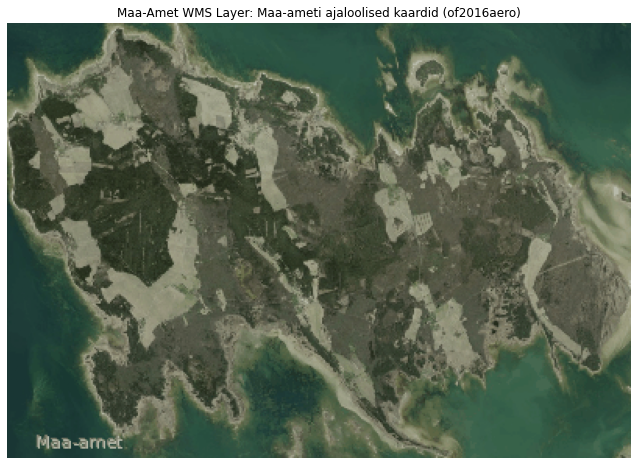

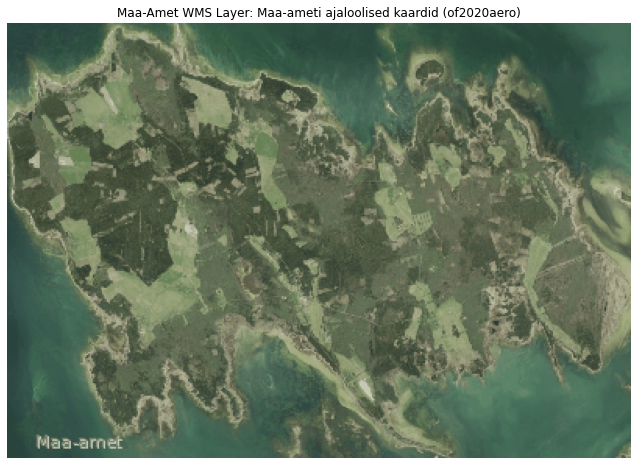

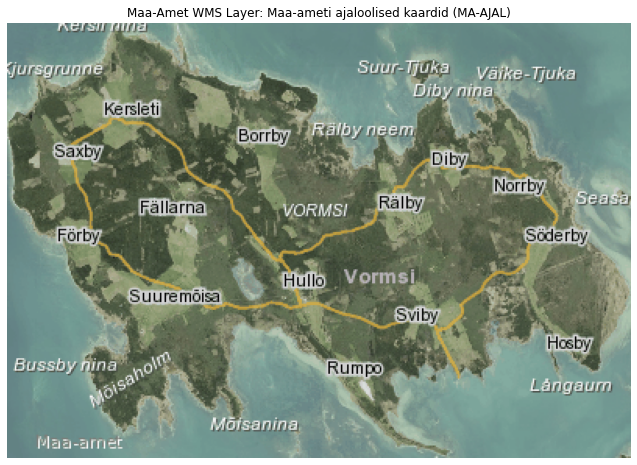

In [72]:

for idx, layer in enumerate(selection):
    try:
        img = wms.getmap(layers=[layer],
                         srs='EPSG:3301',
                         bbox=(bb['minx'], bb['miny'], bb['maxx'], bb['maxy']),
                         size=(width, height),
                         format='image/png'
                        )
        
        fn_name = f"{idx:02}" + '_' + layer + '_vormsi.png'
        out = open(fn_name, 'wb')
        out.write(img.read())
        out.close()
        
        plt.figure(figsize=(12,8))

        plt.title(f"Maa-Amet WMS Layer: {wms[layer_id].title} ({layer})")

        load_img = mpimg.imread(fn_name)
        imgplot = plt.imshow(load_img)
        plt.axis("off")
        plt.savefig(fn_name)
        plt.show()
    
    except Exception as ex:
        print(ex)
        pass    

In [73]:
plt.close()

In [74]:
import imageio

In [75]:
filenames = []

for idx, layer in enumerate(selection):
    fn_name = f"{idx:02}" + '_' + layer + '_vormsi.png'
    filenames.append(fn_name)

In [76]:
images = []

for filename in filenames:
    images.append(imageio.imread(filename))
    
imageio.mimsave('../source/_static/day-17-historical.gif', images, duration=1)